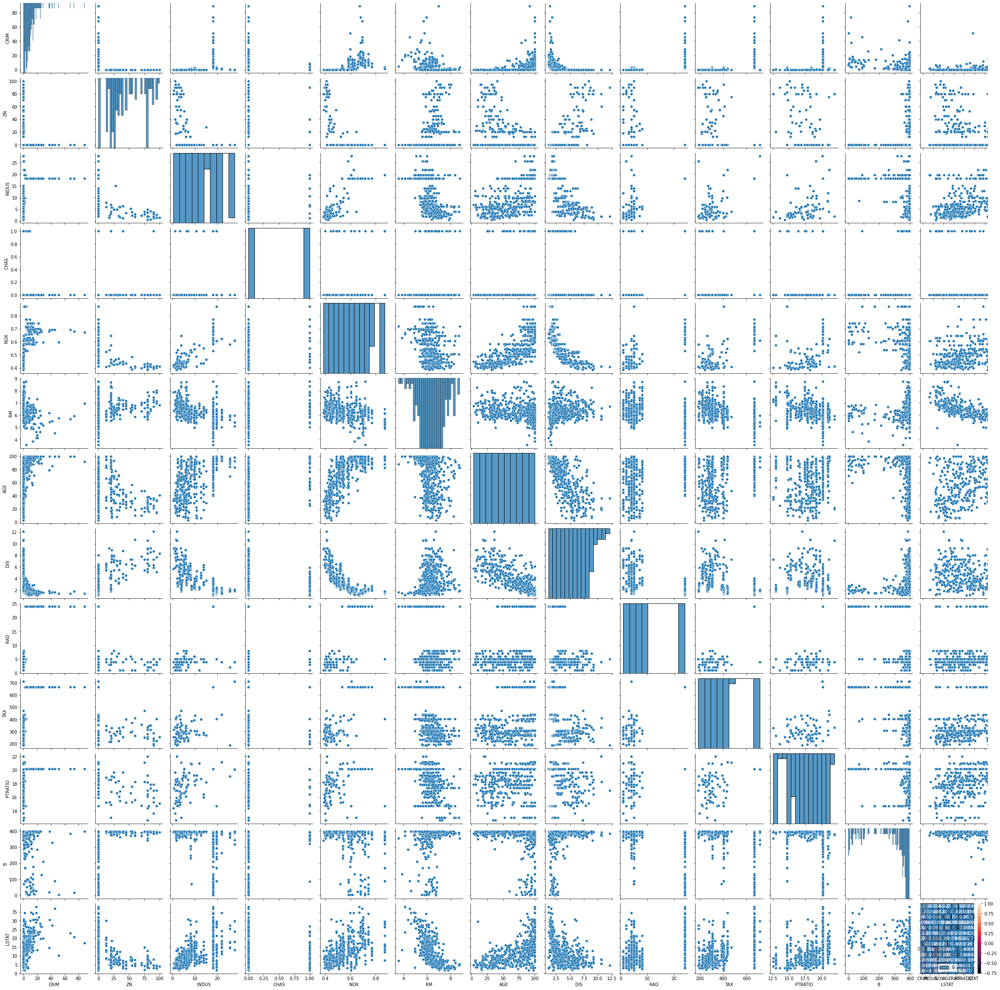

In [1]:
# Adding dependencies
import pandas as pd
import numpy as np
from sklearn import linear_model
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt

# Load the Boston Housing Dataset and print it
from sklearn.datasets import load_boston
boston = load_boston()
# print(boston)

# Transform the dataset into a data frame
# data = the data we want or the independent variables also known as the x-values
# feature_names = The column names of the data
# target = the target price (variable) of the houses or the dependent variable also known as the y value

df_x = pd.DataFrame(boston.data, columns=boston.feature_names)
df_y = pd.DataFrame(boston.target)

# Get some statistics from the Data Set, like the count and the mean
df_x.describe()
'''
# print(df_x.describe())

             CRIM          ZN       INDUS        CHAS         NOX          RM  ...         DIS         RAD         TAX     PTRATIO           B       LSTAT
count  506.000000  506.000000  506.000000  506.000000  506.000000  506.000000  ...  506.000000  506.000000  506.000000  506.000000  506.000000  506.000000
mean     3.613524   11.363636   11.136779    0.069170    0.554695    6.284634  ...    3.795043    9.549407  408.237154   18.455534  356.674032   12.653063
std      8.601545   23.322453    6.860353    0.253994    0.115878    0.702617  ...    2.105710    8.707259  168.537116    2.164946   91.294864    7.141062
min      0.006320    0.000000    0.460000    0.000000    0.385000    3.561000  ...    1.129600    1.000000  187.000000   12.600000    0.320000    1.730000
25%      0.082045    0.000000    5.190000    0.000000    0.449000    5.885500  ...    2.100175    4.000000  279.000000   17.400000  375.377500    6.950000
50%      0.256510    0.000000    9.690000    0.000000    0.538000    6.208500  ...    3.207450    5.000000  330.000000   19.050000  391.440000   11.360000
75%      3.677083   12.500000   18.100000    0.000000    0.624000    6.623500  ...    5.188425   24.000000  666.000000   20.200000  396.225000   16.955000
max     88.976200  100.000000   27.740000    1.000000    0.871000    8.780000  ...   12.126500   24.000000  711.000000   22.000000  396.900000   37.970000
'''

'''
# Get the all the columns
print(df_x.columns)

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT'],
      dtype='object')
'''

# Creating Co-relation scatter plot along with histogram of all the columns in the feature set
sns.pairplot(df_x)

# creating distribution plot of the Price (target set)
sns.histplot(df_y)

'''
# Co-rellation of the feature columns
print(df_x.corr())
             CRIM        ZN     INDUS      CHAS       NOX        RM       AGE       DIS       RAD       TAX   PTRATIO         B     LSTAT
CRIM     1.000000 -0.200469  0.406583 -0.055892  0.420972 -0.219247  0.352734 -0.379670  0.625505  0.582764  0.289946 -0.385064  0.455621
ZN      -0.200469  1.000000 -0.533828 -0.042697 -0.516604  0.311991 -0.569537  0.664408 -0.311948 -0.314563 -0.391679  0.175520 -0.412995
INDUS    0.406583 -0.533828  1.000000  0.062938  0.763651 -0.391676  0.644779 -0.708027  0.595129  0.720760  0.383248 -0.356977  0.603800
CHAS    -0.055892 -0.042697  0.062938  1.000000  0.091203  0.091251  0.086518 -0.099176 -0.007368 -0.035587 -0.121515  0.048788 -0.053929
NOX      0.420972 -0.516604  0.763651  0.091203  1.000000 -0.302188  0.731470 -0.769230  0.611441  0.668023  0.188933 -0.380051  0.590879
RM      -0.219247  0.311991 -0.391676  0.091251 -0.302188  1.000000 -0.240265  0.205246 -0.209847 -0.292048 -0.355501  0.128069 -0.613808
AGE      0.352734 -0.569537  0.644779  0.086518  0.731470 -0.240265  1.000000 -0.747881  0.456022  0.506456  0.261515 -0.273534  0.602339
DIS     -0.379670  0.664408 -0.708027 -0.099176 -0.769230  0.205246 -0.747881  1.000000 -0.494588 -0.534432 -0.232471  0.291512 -0.496996
RAD      0.625505 -0.311948  0.595129 -0.007368  0.611441 -0.209847  0.456022 -0.494588  1.000000  0.910228  0.464741 -0.444413  0.488676
TAX      0.582764 -0.314563  0.720760 -0.035587  0.668023 -0.292048  0.506456 -0.534432  0.910228  1.000000  0.460853 -0.441808  0.543993
PTRATIO  0.289946 -0.391679  0.383248 -0.121515  0.188933 -0.355501  0.261515 -0.232471  0.464741  0.460853  1.000000 -0.177383  0.374044
B       -0.385064  0.175520 -0.356977  0.048788 -0.380051  0.128069 -0.273534  0.291512 -0.444413 -0.441808 -0.177383  1.000000 -0.366087
LSTAT    0.455621 -0.412995  0.603800 -0.053929  0.590879 -0.613808  0.602339 -0.496996  0.488676  0.543993  0.374044 -0.366087  1.000000
'''

# Heat map of the above co-related data
sns.heatmap(df_x.corr(), annot=True)

# Intialize the linear regression model
reg = linear_model.LinearRegression()

# Split the data into 67% training and 33% testing data
# random_state: Maintains the order and is just a seed to craete a random set, e.g 42
x_train, x_test, y_train, y_test = train_test_split(df_x, df_y, test_size=0.33, random_state=42)

# Train the model with our training data
reg.fit(x_train, y_train)

# Print the co-efficient/ weights and each feature / column of our model
'''
# print(reg.coef_)

[[-1.28749718e-01  3.78232228e-02  5.82109233e-02  3.23866812e+00
  -1.61698120e+01  3.90205116e+00 -1.28507825e-02 -1.42222430e+00
   2.34853915e-01 -8.21331947e-03 -9.28722459e-01  1.17695921e-02
  -5.47566338e-01]]
'''

# Print the prediction on our Test Data
y_pred = reg.predict(x_test)
'''
# print(y_pred)

[[28.53469469]
 [36.6187006 ]
 [15.63751079]
 [25.5014496 ]
 [18.7096734 ]
 ...
 [21.0574427 ]
 [25.01734597]
 [27.65461859]
 [20.70205823]
 [40.38214871]]
'''

'''
# print the Actual value
print(y_test)
        0
173  23.6
274  32.4
491  13.6
72   22.8
452  16.1
..    ...
110  21.7
321  23.1
265  22.8
29   21.0
262  48.8
'''

'''
# Check the model performance / accuracy using Mean Squared Error (MSE)
print(np.mean((y_pred - y_test) **2))

0    20.724023
dtype: float64
'''

'''
# Check the model performance / accuracy using Mean Squared Error (MSE) and Sklearn.metrics
from sklearn.metrics import mean_squared_error
print(mean_squared_error(y_test, y_pred))

# 20.724023437339717
'''

# Plotting a histogram to check for the residual
sns.histplot((y_test - y_pred))

# Plotting the actual test result and predicted test result
plt.scatter(y_test, y_pred)
